In [1]:
from reader import Reader
import matplotlib.pyplot as plt
import numpy as np
from math import sin, cos, sqrt, atan2, radians
from datetime import datetime
from datetime import date as date_creator
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from numba import njit
import pandas as pd
import os
from numba import jit

%matplotlib inline

C:\Users\barroisl\AppData\Local\Temp\ipykernel_8744\3735118499.py:11: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
def smooth(x,window_len=11,window='hanning'):
        if x.ndim != 1:
                raise ValueError("smooth only accepts 1 dimension arrays.")
        if x.size < window_len:
                raise ValueError("Input vector needs to be bigger than window size.")
        if window_len<3:
                return x
        if not window in ['flat', 'hanning', 'hamming', 'bartlett', 'blackman']:
                raise ValueError("Window is on of 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'")
        s=np.r_[2*x[0]-x[window_len-1::-1],x,2*x[-1]-x[-1:-window_len:-1]]
        if window == 'flat': #moving average
                w=np.ones(window_len,'d')
        else:
                w=eval('np.'+window+'(window_len)')
        y=np.convolve(w/w.sum(),s,mode='same')
        return y[window_len:-window_len+1]
def get_date_time_dif(start_time,stop_time):
    date = date_creator(1, 1, 1)
    datetime1 = datetime.combine(date, start_time)
    datetime2 = datetime.combine(date, stop_time)
    time_elapsed = datetime1 - datetime2
    return time_elapsed.total_seconds()
def compute_dist(lat1,lon1,lat2,lon2,rad=True):
    if not(rad):
        lat1 = radians(lat1)
        lon1 = radians(lon1)
        lat2 = radians(lat2)
        lon2 = radians(lon2)
    # approximate radius of earth in m
    R = 6373_000.0
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat / 2) ** 2 + cos(lat1) * cos(lat2) * sin(dlon / 2) ** 2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c
def remove_zero_from_alti(alti):
    if alti[0] < 10 :
        alti[0] = alti[1]
    if alti[-1] < 10 :
        alti[-1] = alti[-2]
    for i,alt in enumerate(alti):
        if alt < 10 :
            if i >= len(alti)-1 :
                alti[i] = (alti[i-1]+alti[i])/2
            else :  
                alti[i] = (alti[i-1]+alti[i+1])/2
    return alti

def read_igc(file):
    with open(file, 'r') as f:
        parsed_igc_file = Reader().read(f)
    # print('igc_file created')
    previous_lat = 0
    previous_lon = 0
    
    all_lon = np.zeros(len(parsed_igc_file['fix_records'][1]))
    all_lat = np.zeros(len(parsed_igc_file['fix_records'][1]))
    all_speed=np.zeros(len(parsed_igc_file['fix_records'][1]))
    all_vz=np.zeros(len(parsed_igc_file['fix_records'][1]))
    all_alti=np.zeros(len(parsed_igc_file['fix_records'][1]))
    all_time=[0 for _ in range(len(parsed_igc_file['fix_records'][1]))]

    for i,record in enumerate(parsed_igc_file['fix_records'][1]):
        record['time'] = record['time'].replace(hour=record['time'].hour + 1)
        all_lat[i] = record['lat']
        all_lon[i] = record['lon']
        if previous_lon ==0 :
            previous_lat = record['lat']
            previous_lon = record['lon']
            previous_datetime = record['time']
            previous_alt_gps = record['gps_alt']
            # previous_alt_baro = record['pressure_alt']
            all_time[i] = record['time']
        else :
            dxy = abs(compute_dist(previous_lat,previous_lon,record['lat'],record['lon'],rad=False))
            # dz = previous_alt_baro-record['pressure_alt']
            dz = previous_alt_gps-record['gps_alt']
            dt = get_date_time_dif(record['time'],previous_datetime)
            # if dt>2 : print('dtttttt>2 ',dt)
            if dt>0 :
                all_speed[i] = min(100,dxy/dt*3.6)
                all_vz[i] = dz/dt
            all_alti[i] = record['gps_alt']
            all_time[i] = record['time']
            
            previous_lat = record['lat']
            previous_lon = record['lon']
            previous_datetime = record['time']
            previous_alt_gps = record['gps_alt']
            # previous_alt_baro = record['pressure_alt']

            # if previous_datetime.hour>10 :
            #     all_speed = all_speed[:i]
            #     all_vz = all_vz[:i]
            #     all_alti = all_alti[:i]
            #     break
#    return all_lon,all_lat,all_speed,all_vz,remove_zero_from_alti(all_alti),all_time
    return all_lon,all_lat,all_alti,all_time

def reshape_array(arr,time_vid):
    nb_img_by_sec = 24
    
    t_true = np.linspace(time_vid[0], time_vid[-1], num=len(time_vid), endpoint=True)
    t_inter = np.linspace(time_vid[0], time_vid[-1], num=int(len(time_vid)*nb_img_by_sec/speed_acc), endpoint=True)
    f = interp1d(t_true, arr, kind='cubic')

    return f(t_inter)

def smooth_igc_output(L_all):
    all_ret = []
    for l_val in L_all:
        l_val[0]=l_val[1]#=np.mean(l_val[:int(len(l_val)/10)])
        smoothed = smooth(l_val,50,'hanning')
        all_ret.append(smoothed)
    return all_ret

def plot_smooth_non_smooth(smooth,non_smooth):
    plt.figure(figsize=(18,9))
    plt.plot(non_smooth)
    plt.plot(smooth)
    plt.show()

def get_last_date_of_all_raw_file(path_raw_file):
    delta_time_writing = 20
    all_ending_time = []
    for file in os.listdir(path_raw_file):
        if "_11_" in file :
            time_end = os.path.getmtime(path_raw_file+'\\'+file)
            all_ending_time.append(datetime.fromtimestamp(time_end-delta_time_writing).time())
    return all_ending_time

def convert_time_to_sec(all_time):
    for i in range(len(all_time)):
        all_time[i] = all_time[i].hour*3600 + all_time[i].minute*60 + all_time[i].second
    return np.array(all_time,dtype=np.float32)

In [3]:
from os import listdir
from os.path import isfile, join
path = 'C:/Users/barroisl/Documents/Stage_Léo/Vols/IGC_20-08-2023/Parapente_old/'
#path = 'IGC_20-08-2023/'
#list_files = [path+f for f in listdir(path) if isfile(join(path, f))]
list_files = [f for f in listdir(path) if isfile(join(path, f))]

print(len(list_files))

72


## Autre

In [4]:
[ file for file in list_files if 'MAN' in file ]

['2023-08-20-XCT-MAN-09.igc']

In [5]:
file = '2023-08-20-XCT-BLA-01.igc'
#file = 'IGC_20-08-2023/2023-08-20-XCT-NPH-01.igc'

print('def ok')

def prep_file(path,file) :
#    all_lon,all_lat,all_alti, all_time = read_igc(join(path,file))
    all_lon,all_lat,all_speed, all_vz, all_alti, all_time = read_igc(join(path,file))
#    print('\n process_igc ok')
    
    all_speed_smooth, all_vz_smooth, all_alti_smooth = smooth_igc_output([all_speed, all_vz, all_alti])
    all_vz2 = np.zeros(all_alti_smooth.shape[0])
    
#    print('igc smothed')
    for i,alti in enumerate(list(all_alti_smooth)):
      if i >=all_alti_smooth.shape[0]-1 :
          pass
      else :
          all_vz2[i] = all_alti_smooth[i+1]-all_alti_smooth[i]
    
#    print('smoothed vario ok')
    speed_vid = all_speed_smooth
    vz_vid = all_vz2
    alti_vid = all_alti_smooth
    time_vid = convert_time_to_sec(all_time)
#    print('time to sec ok')

    #return all_lon,all_lat,speed_vid,vz_vid,alti_vid,time_vid,all_vz2,all_speed_smooth, all_vz_smooth, all_alti_smooth,all_alti
    return all_lon,all_lat,all_alti,time_vid ,all_vz2,all_speed_smooth, all_vz_smooth, all_alti_smooth

def liste_files(path):
    return [f for f in listdir(path) if isfile(join(path, f))]

def ok


In [6]:
def map_flight(lon,lat,data,ax,titre=" ", ticks=False,cmap='None',vmin=-5,vmax=5):
    min_lon,max_lon,min_lat,max_lat = np.min(lon),np.max(lon),np.min(lat),np.max(lat)
    ax.stock_img()
    ax.set_extent([min_lon,max_lon,min_lat,max_lat], crs=ccrs.PlateCarree())
    if ticks:
        ax.set_xticks(np.round(np.arange(min_lon,max_lon, 15)), crs=ccrs.PlateCarree())
        ax.set_yticks(np.round(np.arange(min_lat,max_lat, 15)), crs=ccrs.PlateCarree())
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_title(titre,fontsize=15)
    if cmap=='None':
        ax.plot(lon,lat,'-k')
    else:
        scatt = ax.scatter(lon,lat,c=data,s=1, marker='.',cmap=cmap,vmin=vmin,vmax=vmax)
        plt.colorbar(scatt,ax=ax,fraction=0.05)

In [7]:
def map_flight_fond(img_extent,lon,lat,data,ax,titre=" ", ticks=False,cmap='None',vmin=-5,vmax=5):

    min_lon,max_lon,min_lat,max_lat =img_extent[0],img_extent[1],img_extent[2],img_extent[3]
    
    ax.stock_img()
    ax.set_extent([min_lon,max_lon,min_lat,max_lat], crs=ccrs.PlateCarree())
    if ticks:
        ax.set_xticks(np.round(np.arange(min_lon,max_lon, 1)), crs=ccrs.PlateCarree())
        ax.set_yticks(np.round(np.arange(min_lat+1,max_lat, 1)), crs=ccrs.PlateCarree())
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_title(titre,fontsize=15)
    if cmap=='None':
        ax.plot(lon,lat,'-k')
    else:
        scatt = ax.scatter(lon,lat,c=data,s=1, marker='.',cmap=cmap,vmin=vmin,vmax=vmax)
        plt.colorbar(scatt,ax=ax,alpha = 0.1,fraction=0.05, label ='fall absolute velocity ($m.s^{-1}$)')

In [9]:
file = '2023-08-20-XCT-BLA-01.igc'
path = 'C:/Users/barroisl/Documents/Stage_Léo/Vols/IGC_20-08-2023/Parapente_old/'
#all_lon,all_lat,speed_vid,vz_vid,alti_vid,time_vid,all_vz2,all_speed_smooth, all_vz_smooth, all_alti_smooth,all_alti = prep_file(path, file)
all_lon,all_lat,all_alti,all_time = read_igc(join(path,file))

print(min(all_lat),max(all_lat))
print(min(all_lon),max(all_lon))

"""
Ploting Digital Elevation Model (DEM) from .tiff as described on https://docs.wradlib.org/en/stable/notebooks/visualisation/gis_overlay_cartopy.html
"""

print('Changed to EPSG:3035 : Y,X ')
print('2314900.11517319' , '2417226.205997114')
print('3946202.346261816', '4071715.818908612')

43.83883333333333 44.8192
5.347366666666667 6.852966666666667
Changed to EPSG:3035 : Y,X 
2314900.11517319 2417226.205997114
3946202.346261816 4071715.818908612


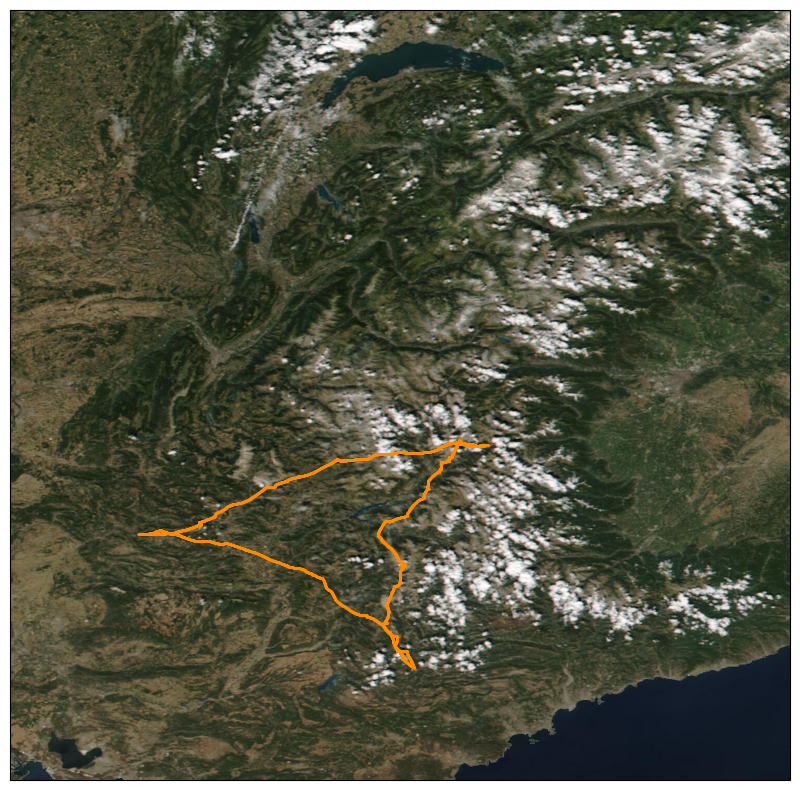

In [17]:
fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.PlateCarree())
img_extent = (4.7942, 8.1545, 43.3545, 46.6707)
#img_extent = (-5.5, 8, 42, 51.5)

fname = 'C:/Users/barroisl/Documents/Stage_Léo/Satellites/Images_MODIS_VIIRS/Alp_2023-08-20_12H28.jpg'
#fname = 'T:/C2H/STAGES/LEO_BARROIS/PIA03393.tif'

img = plt.imread(fname)

ax.imshow(img, origin='upper', extent=img_extent, transform=ccrs.PlateCarree())
ax.scatter(all_lon,all_lat,s=0.1,color = 'darkorange')
plt.show()

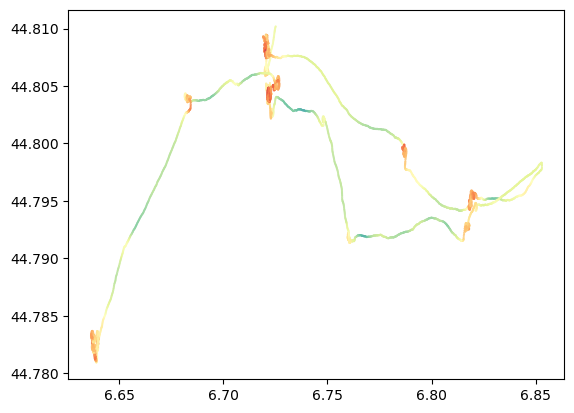

In [10]:
plt.scatter(all_lon[100:4000],all_lat[100:4000],c=all_vz2[100:4000],s=1, marker='.',cmap='Spectral_r',vmin=-5,vmax=5)

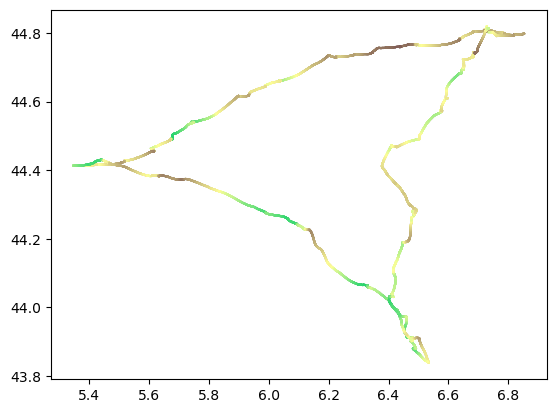

In [11]:
plt.scatter(all_lon,all_lat,c=all_alti,s=1, marker='.',cmap='terrain',vmin=0,vmax=5000)

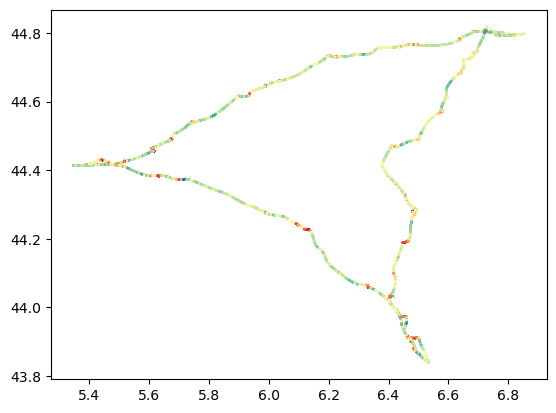

In [12]:
plt.scatter(all_lon,all_lat,c=all_vz2,s=1, marker='.',cmap='Spectral_r',vmin=-5,vmax=5)

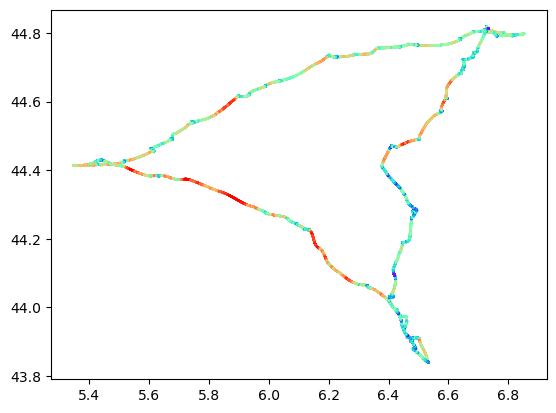

In [13]:
plt.scatter(all_lon,all_lat,c=all_speed_smooth,s=2, marker='.',cmap='rainbow',vmin=20,vmax=80)

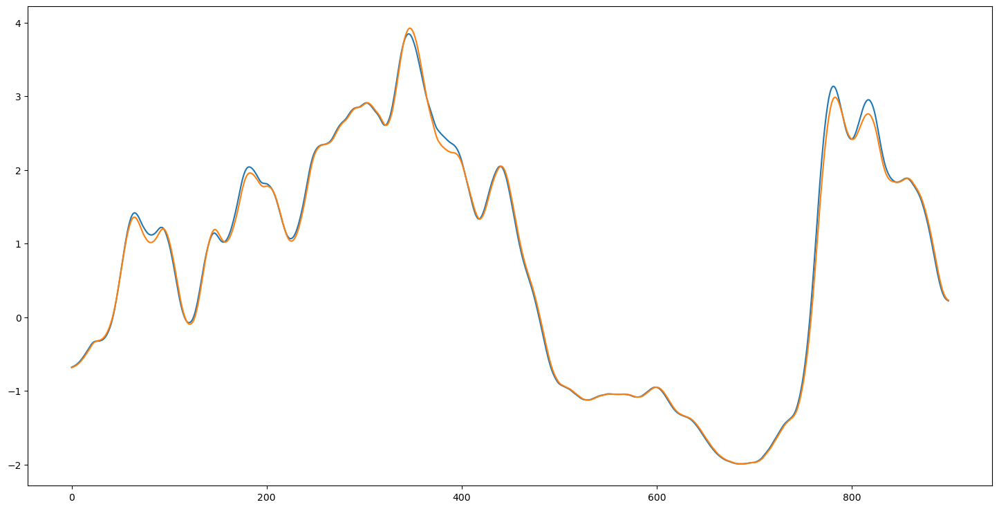

In [14]:
plot_smooth_non_smooth(-all_vz_smooth[100:1000],all_vz2[100:1000])

In [49]:
@njit
def filter_list_2(lst1, lst2, threshold_low1=None, threshold_high1=None, threshold_low2=None, threshold_high2=None):
    filtered_list1 = []
    filtered_list2 = []
    for item1,item2 in zip(lst1,lst2):
        if threshold_low1 is not None and item1 < threshold_low1:
            continue
        if threshold_high1 is not None and item1 > threshold_high1:
            continue
        if threshold_low2 is not None and item2 < threshold_low2:
            continue
        if threshold_high2 is not None and item2 > threshold_high2:
            continue
        filtered_list1.append(item1)
        filtered_list2.append(item2)
    return filtered_list1,filtered_list2

def map_all_flights_fond_para_plan(img_extent,directory,ax,type_vol,color,titre=" ", ticks=True,cmap='None',vmin=-5,vmax=5):

    min_lon,max_lon,min_lat,max_lat =img_extent[0],img_extent[1],img_extent[2],img_extent[3]
    ax.stock_img()
    ax.set_extent([min_lon,max_lon,min_lat,max_lat], crs=ccrs.PlateCarree())
    if ticks:
        ax.set_xticks(np.round(np.arange(min_lon,max_lon, 1)), crs=ccrs.PlateCarree())
        ax.set_yticks(np.round(np.arange(min_lat+1,max_lat, 1)), crs=ccrs.PlateCarree())
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_title(titre,fontsize=15)
    if type_vol == 'para' :
        path = join(directory,'Parapente/')
    elif type_vol == 'plan' :
        path = join(directory,'Planeur/')
    else :
        path = ''
    liste_f = liste_files(join(directory,path))
    for i,file in enumerate(liste_f):
        print(i,end=' ')
        lon,lat,_,vz, _, _ = read_igc(join(directory,join(path,file)))
        lon,lat = filter_list_2(lon, lat, min_lon-10, max_lon+10,min_lat-10, max_lat+10)
        data, = smooth_igc_output([vz])
        if cmap=='None':
            ax.plot(lon,lat,color,alpha = 0.3, linewidth = 0.5)
        else:
            scatt = ax.scatter(lon,lat,c=data,alpha = 0.01,s=1, marker='.',cmap=cmap,vmin=vmin,vmax=vmax)
#    plt.colorbar(scatt,ax=ax,fraction=0.05, label ='Parapente fall absolute velocity ($m.s^{-1}$)')

# Stations netatmo

In [67]:
import pandas as pd
import os

def netatmo_txt(text_file):
    # Read the text file and split lines
    with open(text_file, 'r') as file:
        lines = file.readlines()

    # Extract column names from the first line (assuming it contains column headers)
    column_names = ['id','lon','lat','alt','T','hu','Tbrut','hubrut','t0','t1']
    # Create an empty dictionary to store data for each column
    data = {col: [] for col in column_names}

    # Iterate over the remaining lines to extract data for each column
    for line in lines[1:]:
        values = line.strip().split(' ')
        for col, val in zip(column_names, values):
            if col != 'id' :
                data[col].append(float(val))
            else :
                data[col].append(val)

    # Create a DataFrame from the collected data
    df = pd.DataFrame(data)

    return df

def all_txt(directory):
    
    dfs = []

    text_files = [f for f in os.listdir(directory) if f.endswith('.txt')]
    for text_file in text_files:
        file_path = join(directory,text_file)
        # Read each text file into a DataFrame
        df = netatmo_txt(file_path)  
        dfs.append(df)
        
    concatenated_df = pd.concat(dfs, ignore_index=True)

    return concatenated_df

In [68]:
text_file = 'C:/Users/barroisl/Documents/Stage_Léo/Stations/Observations_NETATMO/TEMP_HUM_RELATIVE/Netatmo_id_lon_lat_alt_t_hu_tbrut_hubrut_t0_t1_20230818220000.txt'

df = netatmo_txt(text_file)

print(df)

                     id       lon        lat     alt     T    hu  Tbrut  \
0     70:ee:50:00:0a:02  5.341308  45.893487   215.0   NaN   NaN   29.6   
1     70:ee:50:00:0a:9e  5.661396  45.204901   211.0   NaN   NaN   28.1   
2     70:ee:50:00:0a:da  5.750908  45.277225  1124.0  21.3  47.0   22.9   
3     70:ee:50:00:0b:c8  5.860382  44.269365   619.0   NaN   NaN   28.8   
4     70:ee:50:00:0c:14  5.179655  45.613582   228.0  28.3   NaN   28.1   
...                 ...       ...        ...     ...   ...   ...    ...   
5266  70:ee:50:a5:b6:c0  7.581954  44.056056   741.0  21.3   NaN   22.3   
5267  70:ee:50:a5:b7:62  6.128310  46.173246   397.0   NaN  49.0   23.5   
5268  70:ee:50:a5:be:50  7.012982  43.706193   345.0  25.2   NaN   28.4   
5269  70:ee:50:ff:ff:18  6.137374  45.940334   500.0  21.7  54.0   21.3   
5270  70:ee:50:ff:ff:4a  5.547736  45.413960   478.0   NaN   NaN    NaN   

      hubrut            t0            t1  
0       36.0  1.692396e+09  1.692397e+09  
1       38.0 

In [69]:
directory_netatmo = 'C:/Users/barroisl/Documents/Stage_Léo/Stations/Observations_NETATMO/TEMP_HUM_RELATIVE/'

dfs = all_txt(directory_netatmo)

print(dfs)

                      id       lon        lat     alt     T    hu  Tbrut  \
0      70:ee:50:00:0a:02  5.341308  45.893487   215.0   NaN   NaN   29.6   
1      70:ee:50:00:0a:9e  5.661396  45.204901   211.0   NaN   NaN   28.1   
2      70:ee:50:00:0a:da  5.750908  45.277225  1124.0  21.3  47.0   22.9   
3      70:ee:50:00:0b:c8  5.860382  44.269365   619.0   NaN   NaN   28.8   
4      70:ee:50:00:0c:14  5.179655  45.613582   228.0  28.3   NaN   28.1   
...                  ...       ...        ...     ...   ...   ...    ...   
10512  70:ee:50:a5:b6:c0  7.581954  44.056056   741.0  20.7   NaN   21.9   
10513  70:ee:50:a5:b7:62  6.128310  46.173246   397.0   NaN   NaN   23.3   
10514  70:ee:50:a5:be:50  7.012982  43.706193   345.0  24.7  48.0   27.9   
10515  70:ee:50:ff:ff:18  6.137374  45.940334   500.0  20.5  56.0   19.9   
10516  70:ee:50:ff:ff:4a  5.547736  45.413960   478.0   NaN   NaN    NaN   

       hubrut            t0            t1  
0        36.0  1.692396e+09  1.692397e+09  

In [70]:
img_extent = (4.7942, 8.1545, 43.3545, 46.6707)

df_cropped = dfs[(dfs['lat'] >=img_extent[2]) & (dfs['lat'] <= img_extent[3]) &
              (dfs['lon'] >= img_extent[0]) & (dfs['lon'] <= img_extent[1])]

print(df_cropped)

                      id       lon        lat     alt     T    hu  Tbrut  \
0      70:ee:50:00:0a:02  5.341308  45.893487   215.0   NaN   NaN   29.6   
1      70:ee:50:00:0a:9e  5.661396  45.204901   211.0   NaN   NaN   28.1   
2      70:ee:50:00:0a:da  5.750908  45.277225  1124.0  21.3  47.0   22.9   
3      70:ee:50:00:0b:c8  5.860382  44.269365   619.0   NaN   NaN   28.8   
4      70:ee:50:00:0c:14  5.179655  45.613582   228.0  28.3   NaN   28.1   
...                  ...       ...        ...     ...   ...   ...    ...   
10512  70:ee:50:a5:b6:c0  7.581954  44.056056   741.0  20.7   NaN   21.9   
10513  70:ee:50:a5:b7:62  6.128310  46.173246   397.0   NaN   NaN   23.3   
10514  70:ee:50:a5:be:50  7.012982  43.706193   345.0  24.7  48.0   27.9   
10515  70:ee:50:ff:ff:18  6.137374  45.940334   500.0  20.5  56.0   19.9   
10516  70:ee:50:ff:ff:4a  5.547736  45.413960   478.0   NaN   NaN    NaN   

       hubrut            t0            t1  
0        36.0  1.692396e+09  1.692397e+09  

In [71]:
def map_station_fond(img_extent,lon,lat,ax,alpha,color = "r",titre=" ", ticks=True):

    min_lon,max_lon,min_lat,max_lat =img_extent[0],img_extent[1],img_extent[2],img_extent[3]
    
    ax.stock_img()
    ax.set_extent([min_lon,max_lon,min_lat,max_lat], crs=ccrs.PlateCarree())
    if ticks:
        ax.set_xticks(np.round(np.arange(min_lon,max_lon, 1)), crs=ccrs.PlateCarree())
        ax.set_yticks(np.round(np.arange(min_lat+1,max_lat, 1)), crs=ccrs.PlateCarree())
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_title(titre,fontsize=15)
    scatt = ax.scatter(lon,lat, alpha=alpha, s=0.1, marker='.', color = color)

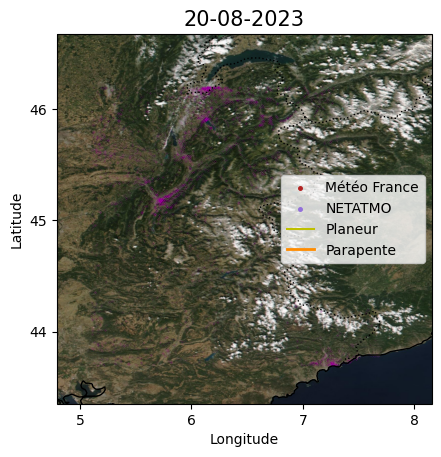

In [89]:
lon,lat = df_cropped['lon'].values, df_cropped['lat'].values

ax = plt.axes(projection=ccrs.PlateCarree())

img = plt.imread(fname)
#ax.imshow(img, origin='upper', extent=img_extent, transform=ccrs.PlateCarree())

img_extent = (4.7942, 8.1545, 43.3545, 46.6707)
map_station_fond(img_extent,lon,lat,ax,0.1, 'm',titre="20-08-2023", ticks=True)
plt.scatter(0,0,s=26, color ='firebrick',marker = '.',label='Météo France')
plt.scatter(0,0,s=26, color ='mediumpurple',marker = '.',label='NETATMO')
plt.plot([0,1],[0,1],'y',linewidth = 1.5,label='Planeur')
plt.plot([0,1],[0,1],'darkorange',linewidth = 2,label='Parapente')

plt.legend()
ax.imshow(img, origin='upper', extent=img_extent, transform=ccrs.PlateCarree())

# Stations météo france

In [18]:
import pandas as pd
import os
from datetime import datetime

def convert_to_datetime(datetime_string):
    datetime_obj = datetime.strptime(datetime_string, '%Y%m%d%H%M%S')
    return datetime_obj

def is_a_letter_in(string) :
    res = []
    for i in string :
        res.append(i.isalpha())
    if True in res :
        return True
    else :
        return False

def test_string(s,name_col):
    if '\\' in s:
        return np.nan
    elif s.strip() == '':
        return np.nan  
    elif s.isalpha() :
        return s
    elif name_col == 'date' :
        return convert_to_datetime(s)
    else:
        try:
            if float(s) == 999999 :
                return np.nan
            else : 
                return float(s)
        except ValueError:
            return s

def meteo_france_txt(text_file):
    # Read the text file and split lines
    with open(text_file, 'r') as file:
        lines = file.readlines()

    # Extract column names from the first line (assuming it contains column headers)
    column_names = ['date','type','n°OMM','n°Météo-France','nom_sta','lon','lat',
                    'altitude_baromètre (m)','altitude_station (m)','pression (Pa)',
                   'pr_nmer', 'T-1.5','T_r','hu','precip_1h','dir_vent_moy',
                   'u_moy','u_inst','dir_vent_inst','u_vent_inst_max']
    # Create an empty dictionary to store data for each column
    data = {col: [] for col in column_names}

    # Iterate over the remaining lines to extract data for each column
    for line in lines[1:]:
        values = line.strip().split(';')
        if len(column_names) == len(values) -1 : 
            for col, val in zip(column_names, values):
                data[col].append(test_string(val,col))

    # Create a DataFrame from the collected data
    df = pd.DataFrame(data)

    return df

def all_txt_mf(directory):
    
    dfs = []

    text_files = [f for f in os.listdir(directory) if f.endswith('.txt')]
    for text_file in text_files:
        file_path = join(directory,text_file)
        # Read each text file into a DataFrame
        df = meteo_france_txt(file_path)  
        dfs.append(df)
        
    concatenated_df = pd.concat(dfs, ignore_index=True)

    return concatenated_df

In [115]:
text_file_mf = 'C:/Users/barroisl/Documents/Stage_Léo/Stations/Observations_Meteo-France_et_partenaires/MF_ALL_OBS_with_WIND_20230824050000_1H.txt'

df_mf = meteo_france_txt(text_file_mf)

print(df_mf)


                     date  type   n°OMM  n°Météo-France nom_sta      lon  \
0     2023-08-24 05:00:00  CALH     NaN       1027003.0     NaN  5.10667   
1     2023-08-24 05:00:00  CALH     NaN       1033002.0     NaN  5.81417   
2     2023-08-24 05:00:00  CALH     NaN       1034004.0     NaN  5.68800   
3     2023-08-24 05:00:00  CALH     NaN       1064001.0     NaN  5.48717   
4     2023-08-24 05:00:00  CALH     NaN       1071001.0     NaN  6.08033   
...                   ...   ...     ...             ...     ...      ...   
11392 2023-08-24 05:40:00   SOL  3853.0             NaN     NaN -2.64278   
11393 2023-08-24 05:40:00   SOL  3882.0             NaN     NaN  0.31655   
11394 2023-08-24 05:40:00   SOL  3904.0             NaN     NaN -7.57748   
11395 2023-08-24 05:40:00   SOL  3915.0             NaN     NaN -6.45781   
11396 2023-08-24 05:40:00   SOL  3930.0             NaN     NaN -2.55933   

            lat  altitude_baromètre (m)  altitude_station (m)  pression (Pa)  \
0      

In [116]:
directory_mf = 'C:/Users/barroisl/Documents/Stage_Léo/Stations/Observations_Meteo-France_et_partenaires/'

dfs_mf = all_txt_mf(directory_mf)

dfs_mf.head(10)

,date,type,n°OMM,n°Météo-France,nom_sta,lon,lat,altitude_baromètre (m),altitude_station (m),pression (Pa),pr_nmer,T-1.5,T_r,hu,precip_1h,dir_vent_moy,u_moy,u_inst,dir_vent_inst,u_vent_inst_max
0,2023-08-19,CALH,NaN,1027003.0,NaN,5.10667,45.83300,196.0,NaN,NaN,NaN,292.65,287.05,70.0,NaN,NaN,NaN,NaN,NaN,NaN
1,2023-08-19,CALH,NaN,1033002.0,NaN,5.81417,46.08650,350.0,NaN,NaN,NaN,289.95,286.05,78.0,0.0,270.0,0.7,280.0,1.6,NaN
2,2023-08-19,CALH,NaN,1034004.0,NaN,5.68800,45.76933,330.0,NaN,NaN,NaN,295.75,285.95,54.0,0.0,10.0,0.6,30.0,1.1,NaN
3,2023-08-19,CALH,NaN,1064001.0,NaN,5.48717,45.77717,281.0,NaN,NaN,NaN,293.95,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
4,2023-08-19,CALH,NaN,1071001.0,NaN,6.08033,46.31033,507.0,NaN,NaN,NaN,295.25,284.35,50.0,0.0,320.0,1.5,300.0,2.7,NaN
5,2023-08-19,CALH,NaN,1072001.0,NaN,5.28767,46.20433,260.0,NaN,NaN,NaN,299.35,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
6,2023-08-19,CALH,NaN,1089001.0,NaN,5.32933,45.97650,250.0,252.0,98570.0,101440.0,297.55,285.15,46.0,0.0,140.0,2.7,140.0,5.5,NaN
7,2023-08-19,CALH,NaN,1104002.0,NaN,5.86717,46.22167,580.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
8,2023-08-19,CALH,NaN,1143002.0,NaN,6.13967,46.34150,467.0,NaN,NaN,NaN,288.65,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
9,2023-08-19,CALH,NaN,1185004.0,NaN,5.59817,45.97967,805.0,NaN,NaN,NaN,288.83,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN


In [117]:
dfs_mf.tail(10)

,date,type,n°OMM,n°Météo-France,nom_sta,lon,lat,altitude_baromètre (m),altitude_station (m),pression (Pa),pr_nmer,T-1.5,T_r,hu,precip_1h,dir_vent_moy,u_moy,u_inst,dir_vent_inst,u_vent_inst_max
1630826,2023-08-24 23:40:00,SOL,3772.0,NaN,NaN,-0.45061,51.47922,25.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1630827,2023-08-24 23:40:00,SOL,3797.0,NaN,NaN,1.33539,51.34652,49.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1630828,2023-08-24 23:40:00,SOL,3803.0,NaN,NaN,-6.29574,49.91465,31.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1630829,2023-08-24 23:40:00,SOL,3809.0,NaN,NaN,-5.25707,50.08440,76.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1630830,2023-08-24 23:40:00,SOL,3840.0,NaN,NaN,-3.24013,50.86023,252.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1630831,2023-08-24 23:40:00,SOL,3853.0,NaN,NaN,-2.64278,51.00639,20.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1630832,2023-08-24 23:40:00,SOL,3882.0,NaN,NaN,0.31655,50.89096,52.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1630833,2023-08-24 23:40:00,SOL,3904.0,NaN,NaN,-7.57748,54.70709,49.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1630834,2023-08-24 23:40:00,SOL,3915.0,NaN,NaN,-6.45781,54.86534,64.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1630835,2023-08-24 23:40:00,SOL,3930.0,NaN,NaN,-2.55933,51.55138,75.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [73]:
img_extent = (4.7942, 8.1545, 43.3545, 46.6707)

dfs_mf_cropped =  dfs_mf[(dfs_mf['lat'] >=img_extent[2]) & (dfs_mf['lat'] <= img_extent[3]) &
              (dfs_mf['lon'] >= img_extent[0]) & (dfs_mf['lon'] <= img_extent[1])]

lon_mf,lat_mf,alt_mf = dfs_mf_cropped['lon'].values, dfs_mf_cropped['lat'].values, dfs_mf_cropped['altitude_station (m)'].values

ax = plt.axes(projection=ccrs.PlateCarree())

img = plt.imread(fname)
#ax.imshow(img, origin='upper', extent=img_extent, transform=ccrs.PlateCarree())

map_station_fond(img_extent,lon_mf,lat_mf,ax,0.1, 'mediumpurple',titre="20-08-2023", ticks=True)
ax.imshow(img, origin='upper', extent=img_extent, transform=ccrs.PlateCarree())
plt.legend()

NameError: name 'dfs_mf' is not defined

## Affichage Parapente/

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 para
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147

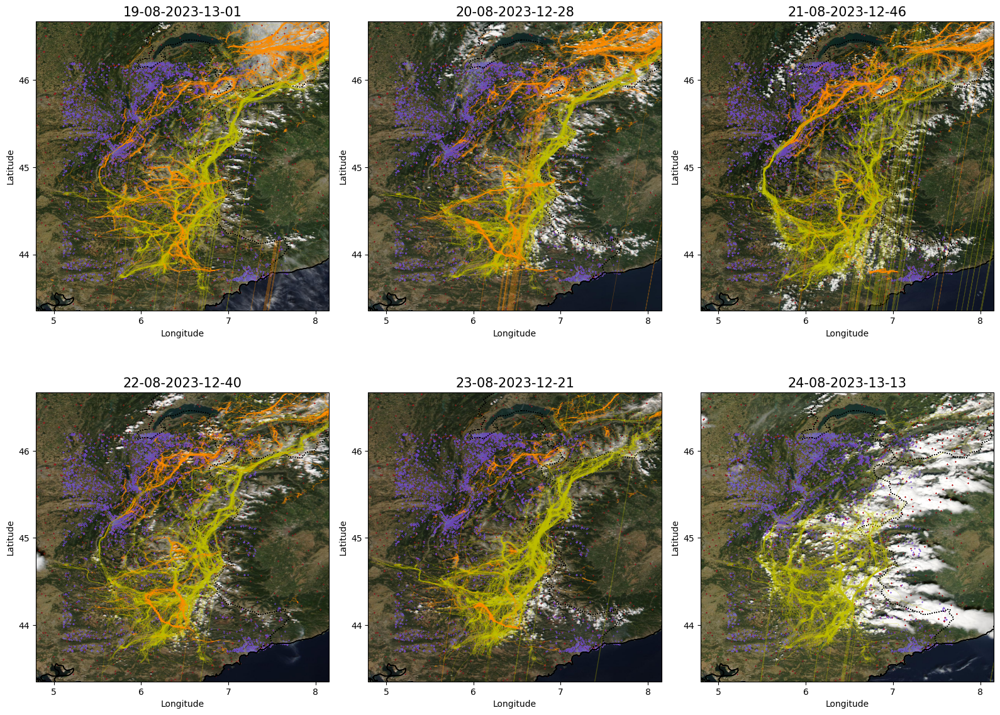

In [181]:
directory_sat = 'C:/Users/barroisl/Documents/Stage_Léo/Satellites/Images_MODIS_VIIRS/'
fnames = ['Alp_2023-08-19_13H01.jpg','Alp_2023-08-20_12H28.jpg','Alp_2023-08-21_12H46.jpg',
          'Alp_2023-08-22_12H40.jpg','Alp_2023-08-23_12H21.jpg','Alp_2023-08-24_13H13.jpg']
days = ['IGC_19-08-2023/','IGC_20-08-2023/','IGC_21-08-2023/','IGC_22-08-2023/','IGC_23-08-2023/','IGC_24-08-2023/']
titres = ["19-08-2023-13-01","20-08-2023-12-28","21-08-2023-12-46","22-08-2023-12-40","23-08-2023-12-21","24-08-2023-13-13"]

#ax.imshow(img, origin='upper', extent=img_extent, transform=ccrs.PlateCarree())

img_extent = (4.7942, 8.1545, 43.3545, 46.6707)

fig,axs = plt.subplots(nrows=2,ncols=3,figsize=(16, 12), subplot_kw={'projection': ccrs.PlateCarree()})

for i in range(6):
    ax = axs[i//3,i%3]
    img = plt.imread(join(directory_sat,fnames[i]))
#    print(join(directory,days_3[i]))
    map_station_fond(img_extent,lon_mf,lat_mf,ax,'météo france',0.1,color='firebrick',titre=titres[i], ticks=True)
    map_station_fond(img_extent,lon,lat,ax,'netatmo',0.1, 'mediumpurple',titre=titres[i], ticks=True)
    map_all_flights_fond_para_plan(img_extent,join(directory,days[i]),ax,'plan','y',titre=titres[i], ticks=True,cmap='None',vmin=-5,vmax=5)
    print('para')
    map_all_flights_fond_para_plan(img_extent,join(directory,days[i]),ax,'para','darkorange',titre=titres[i], ticks=True,cmap='None',vmin=-5,vmax=5)
    ax.imshow(img, origin='upper', extent=img_extent, transform=ccrs.PlateCarree())

plt.tight_layout()
savepath = 'C:/Users/barroisl/Documents/Stage_Léo/figures/'
plt.savefig(join(savepath,'figure1_f.png'))
plt.show()

# Affichage en comptant la disponibilité journalière

## Netatmo

In [8]:
import pandas as pd
import os

def netatmo_txt(text_file):
    # Read the text file and split lines
    with open(text_file, 'r') as file:
        lines = file.readlines()

    # Extract column names from the first line (assuming it contains column headers)
    column_names = ['id','lon','lat','alt','T','hu','Tbrut','hubrut','t0','t1']
    # Create an empty dictionary to store data for each column
    data = {col: [] for col in column_names}

    # Iterate over the remaining lines to extract data for each column
    for line in lines[1:]:
        values = line.strip().split(' ')
        for col, val in zip(column_names, values):
            if col != 'id' :
                data[col].append(float(val))
            else :
                data[col].append(val)

    # Create a DataFrame from the collected data
    df = pd.DataFrame(data)

    return df

def all_txt(directory):
    
    dfs = []

    text_files = [f for f in os.listdir(directory) if f.endswith('.txt')]
    for text_file in text_files:
        file_path = join(directory,text_file)
        # Read each text file into a DataFrame
        df = netatmo_txt(file_path)  
        dfs.append(df)
        
    concatenated_df = pd.concat(dfs, ignore_index=True)

    return concatenated_df

In [28]:
repos = ['19-08-2023/','20-08-2023/','21-08-2023/','22-08-2023/','23-08-2023/','23-08-2023/']
dfs_daytoday = []
path_netatmo = 'C:/Users/barroisl/Documents/Stage_Léo/Stations/Observations_NETATMO/TEMP_HUM_RELATIVE/'

for i in repos :
    dfs_daytoday.append(all_txt(join(path_netatmo,i)))

## Météo france

In [29]:
repos = ['19-08-2023/','20-08-2023/','21-08-2023/','22-08-2023/','23-08-2023/','23-08-2023/']
dfs_daytoday_mf = []
directory_mf = 'C:/Users/barroisl/Documents/Stage_Léo/Stations/Observations_Meteo-France_et_partenaires/'

for i in repos :
    dfs_daytoday_mf.append(all_txt_mf(join(directory_mf,i)))

## Day to day stations plot (netatmo and meteo france)

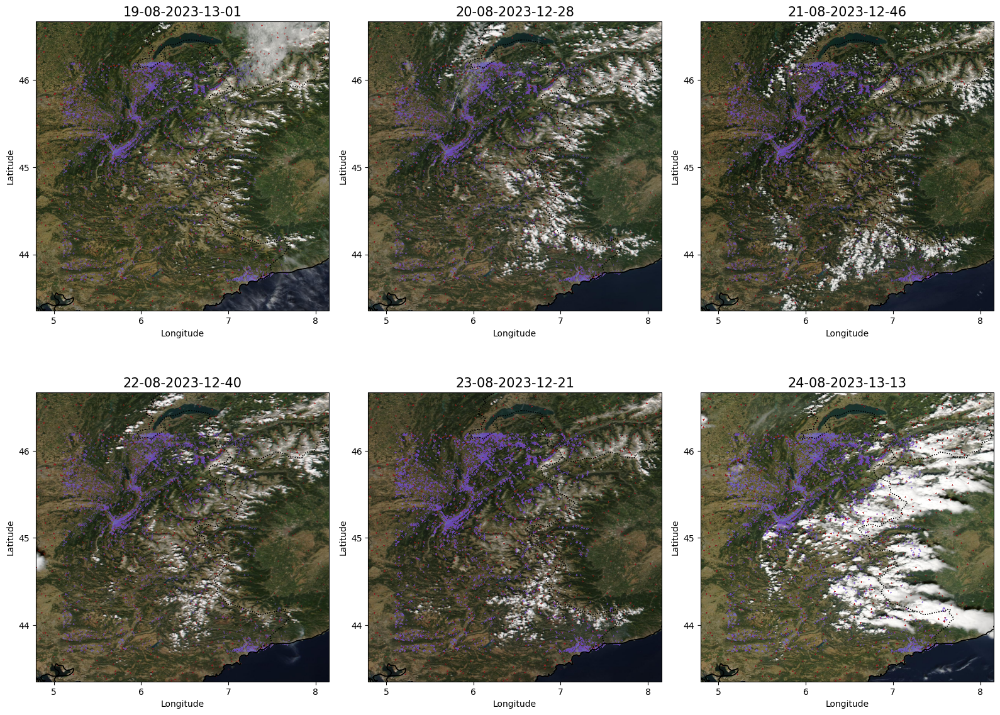

In [33]:
directory_sat = 'C:/Users/barroisl/Documents/Stage_Léo/Satellites/Images_MODIS_VIIRS/'
fnames = ['Alp_2023-08-19_13H01.jpg','Alp_2023-08-20_12H28.jpg','Alp_2023-08-21_12H46.jpg',
          'Alp_2023-08-22_12H40.jpg','Alp_2023-08-23_12H21.jpg','Alp_2023-08-24_13H13.jpg']
titres = ["19-08-2023-13-01","20-08-2023-12-28","21-08-2023-12-46","22-08-2023-12-40","23-08-2023-12-21","24-08-2023-13-13"]

img_extent = (4.7942, 8.1545, 43.3545, 46.6707)

fig,axs = plt.subplots(nrows=2,ncols=3,figsize=(16, 12), subplot_kw={'projection': ccrs.PlateCarree()})

for i in range(6):
    ax = axs[i//3,i%3]
    img = plt.imread(join(directory_sat,fnames[i]))
    lon,lat = dfs_daytoday[i]['lon'],dfs_daytoday[i]['lat']
    lon_mf,lat_mf = dfs_daytoday_mf[i]['lon'],dfs_daytoday_mf[i]['lat']
    map_station_fond(img_extent,lon_mf,lat_mf,ax,'météo france',0.1,color='firebrick',titre=titres[i], ticks=True)
    map_station_fond(img_extent,lon,lat,ax,'netatmo',0.1, 'mediumpurple',titre=titres[i], ticks=True)
    ax.imshow(img, origin='upper', extent=img_extent, transform=ccrs.PlateCarree())

plt.tight_layout()
savepath = 'C:/Users/barroisl/Documents/Stage_Léo/figures/'
plt.savefig(join(savepath,'figure1_f.png'))
plt.show()

# Day to day plot all datas

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 para
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147

C:\Users\barroisl\.conda\envs\barbapapa\Lib\site-packages\cartopy\mpl\geoaxes.py:508: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  return super().get_tightbbox(renderer, *args, **kwargs)
C:\Users\barroisl\.conda\envs\barbapapa\Lib\site-packages\cartopy\mpl\geoaxes.py:535: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  return super().draw(renderer=renderer, **kwargs)
C:\Users\barroisl\.conda\envs\barbapapa\Lib\site-packages\cartopy\mpl\geoaxes.py:535: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  return super().draw(renderer=renderer, **kwargs)
C:\Users\barroisl\.conda\envs\barbapapa\Lib\site-packages\cartopy\mpl\geoaxes.py:535: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  return super().draw(renderer=renderer, **kwargs)
C:\Users\barroisl\.conda\envs\barbapapa\Lib\site-packages\cartopy\mpl\geoaxes.py:535: UserWarning: Creati

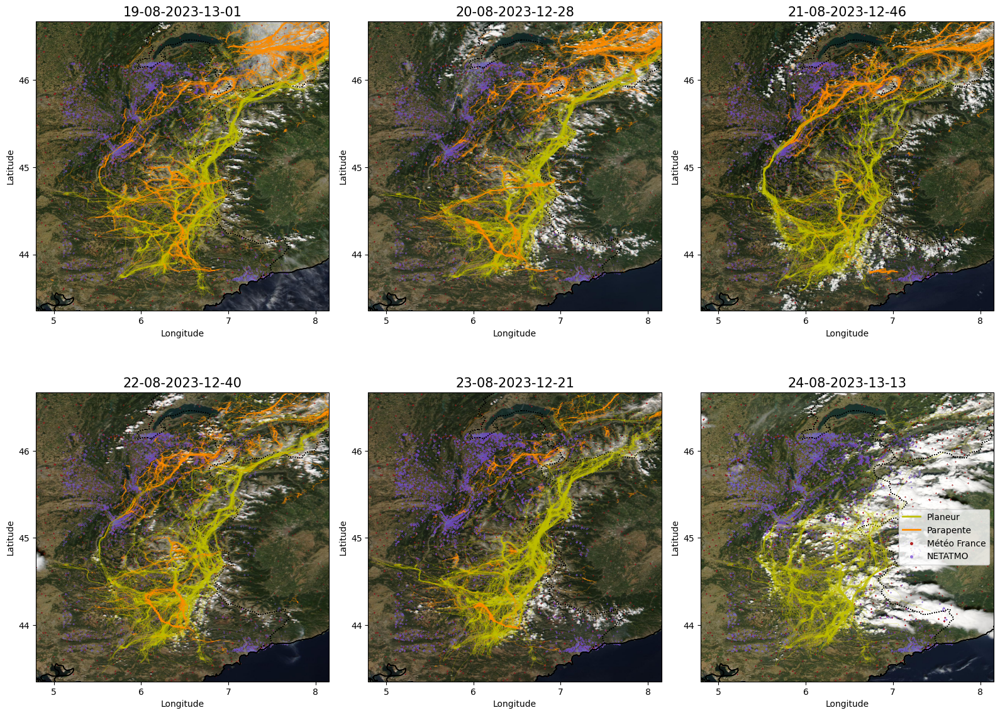

In [91]:
directory_sat = 'C:/Users/barroisl/Documents/Stage_Léo/Satellites/Images_MODIS_VIIRS/'
fnames = ['Alp_2023-08-19_13H01.jpg','Alp_2023-08-20_12H28.jpg','Alp_2023-08-21_12H46.jpg',
          'Alp_2023-08-22_12H40.jpg','Alp_2023-08-23_12H21.jpg','Alp_2023-08-24_13H13.jpg']
days = ['IGC_19-08-2023/','IGC_20-08-2023/','IGC_21-08-2023/','IGC_22-08-2023/','IGC_23-08-2023/','IGC_24-08-2023/']
titres = ["19-08-2023-13-01","20-08-2023-12-28","21-08-2023-12-46","22-08-2023-12-40","23-08-2023-12-21","24-08-2023-13-13"]
directory = 'C:/Users/barroisl/Documents/Stage_Léo/Vols/'

#ax.imshow(img, origin='upper', extent=img_extent, transform=ccrs.PlateCarree())

img_extent = (4.7942, 8.1545, 43.3545, 46.6707)

fig,axs = plt.subplots(nrows=2,ncols=3,figsize=(16, 12), subplot_kw={'projection': ccrs.PlateCarree()})

for i in range(6):
    ax = axs[i//3,i%3]
    img = plt.imread(join(directory_sat,fnames[i]))
    lon,lat = dfs_daytoday[i]['lon'],dfs_daytoday[i]['lat']
    lon_mf,lat_mf = dfs_daytoday_mf[i]['lon'],dfs_daytoday_mf[i]['lat']
    map_station_fond(img_extent,lon_mf,lat_mf,ax,0.1,color='firebrick',titre=titres[i], ticks=True)
    map_station_fond(img_extent,lon,lat,ax,0.1, 'mediumpurple',titre=titres[i], ticks=True)
    map_all_flights_fond_para_plan(img_extent,join(directory,days[i]),ax,'plan','y',titre=titres[i], ticks=True,cmap='None',vmin=-5,vmax=5)
    print('para')
    map_all_flights_fond_para_plan(img_extent,join(directory,days[i]),ax,'para','darkorange',titre=titres[i], ticks=True,cmap='None',vmin=-5,vmax=5)
    ax.imshow(img, origin='upper', extent=img_extent, transform=ccrs.PlateCarree())
    if i == 5 :
        plt.plot([0,1],[0,1],'y',linewidth = 2,label='Planeur')
        plt.plot([0,1],[0,1],'darkorange',linewidth = 2,label='Parapente')
        plt.scatter(0,0,s=26, color ='firebrick',marker = '.',label='Météo France')
        plt.scatter(0,0,s=26, color ='mediumpurple',marker = '.',label='NETATMO')
      
plt.legend()
plt.tight_layout()
savepath = 'C:/Users/barroisl/Documents/Stage_Léo/figures/'
plt.savefig(join(savepath,'figure1_f.png'))
plt.show()